In this tutorial we try to explain the relevance of convolutions for extracting relevant featues from images.

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [4]:
from google.colab import files
uploaded = files.upload()

Saving scuola-di-atene.jpg to scuola-di-atene.jpg


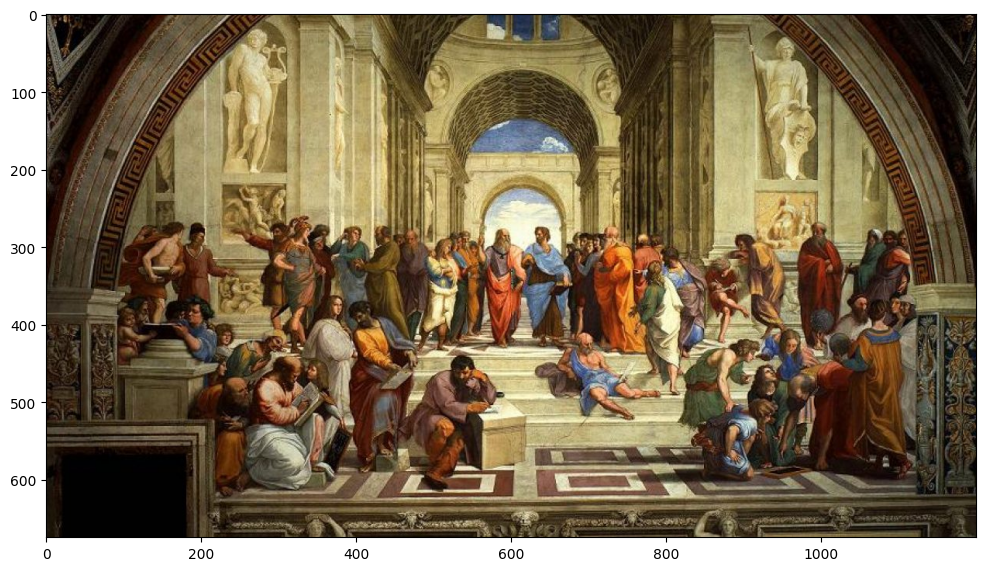

In [7]:
image = cv2.imread('scuola-di-atene.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
fig, ax = plt.subplots(1, figsize=(12,8))

plt.imshow(image)

Our first kernel is just meant to compute horizontal derivatives. We use **central differences** to detect vertical edges in the image. When this kernel is applied to an image using convolution, it will highlight areas where there are strong horizontal changes in intensity.


In [8]:
kernel = np.zeros((3,3))
kernel[:,0] = -1
kernel[:,2] = 1
kernel

array([[-1.,  0.,  1.],
       [-1.,  0.,  1.],
       [-1.,  0.,  1.]])

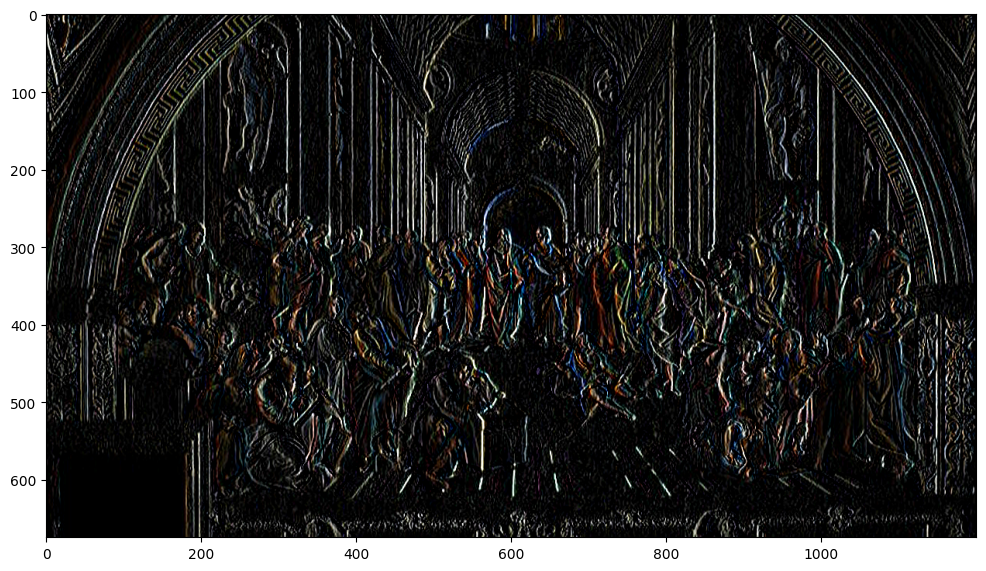

In [9]:
img = cv2.filter2D(image, -1, kernel)
fig, ax = plt.subplots(1, figsize=(12,8))
plt.imshow(img)

Next one is the vertical derivative, i.e. horizontal edges.

In [10]:
kernel = np.zeros((3,3))
kernel[0,:] = -1
kernel[2,:] = 1
kernel

array([[-1., -1., -1.],
       [ 0.,  0.,  0.],
       [ 1.,  1.,  1.]])

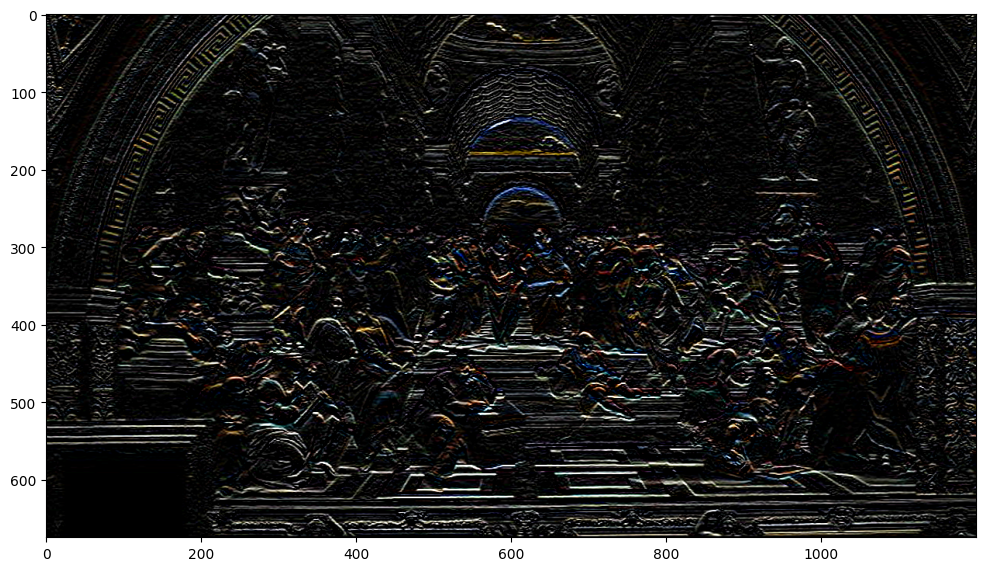

In [11]:
img = cv2.filter2D(image, -1, kernel)
fig, ax = plt.subplots(1, figsize=(12,8))
plt.imshow(img)

**Blurring**.
We use a mean filter (average blur) which works by averaging the pixel values in the neighborhood around each pixel.
When this kernel is applied to an image using convolution, it replaces each pixel's value with the average of its neighboring pixels within the kernel's region. In other words, each pixel is influenced by its 49 neighbors (since the kernel is 7x7).



1/49 *
\begin{bmatrix}
1 & 1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 & 1
\end{bmatrix}

In [12]:
kernel = np.ones((7, 7), np.float32) / 49

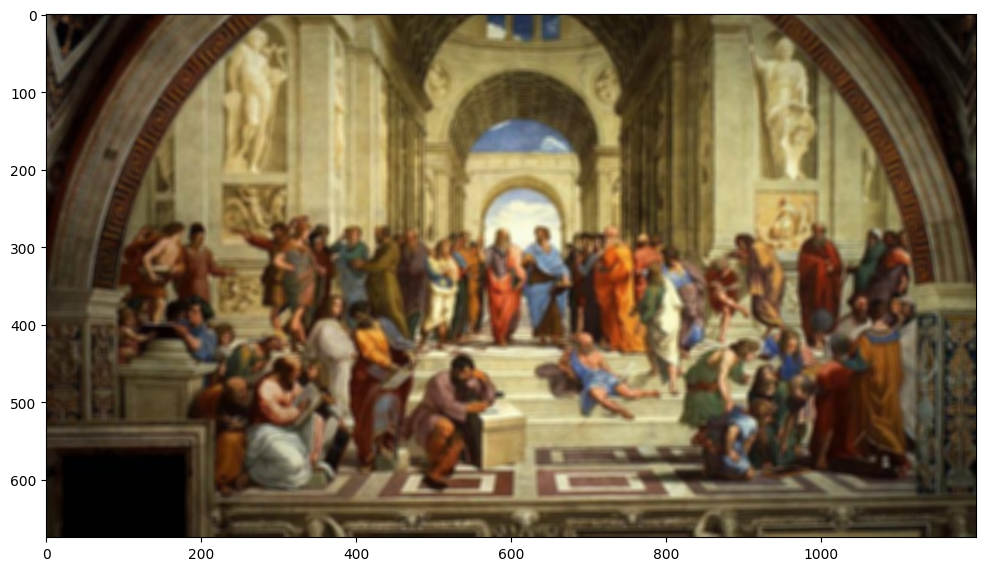

In [13]:
img = cv2.filter2D(image, -1, kernel)
fig, ax = plt.subplots(1, figsize=(12,8))
plt.imshow(img)

In [21]:
kernel = np.ones((3, 3), np.float32) / 9
#since we average using only the nearby 9 pixels (instead of 49) the blurring is less accentuated

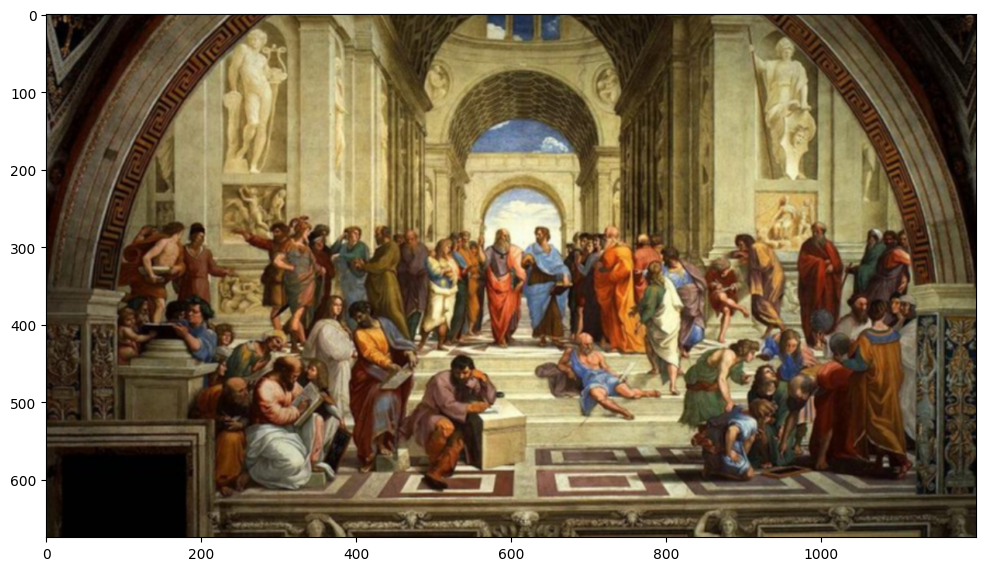

In [22]:
img2 = cv2.filter2D(image, -1, kernel)
fig, ax = plt.subplots(1, figsize=(12,8))
plt.imshow(img2)


Difference between blurrings (simulating the difference between two visions of a same image with slightly different focal distances).
The image you see is made of the high frequency components that we lose in 7x7 but keep in 3x3.

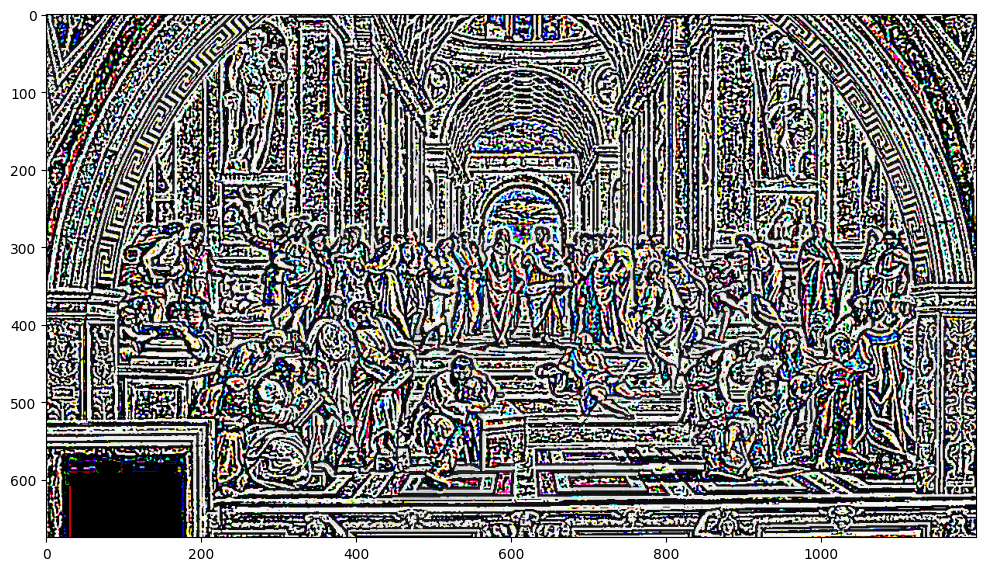

In [23]:
img3 = img - img2
fig, ax = plt.subplots(1, figsize=(12,8))
plt.imshow(img3)

When you subtract img2 from img (img3 = img - img2), you're essentially computing the difference in blurriness between the two versions. This difference highlights the detail that was lost in the larger blur (7x7 kernel) but still present in the smaller blur (3x3 kernel).

**Sum of derivatives**
The sum of derivatives kernel computes the difference between the pixel values of neighboring pixels in both the horizontal and vertical directions.
The kernel emphasizes edges in the image where the intensity changes in both the horizontal and vertical directions.

In [ ]:
kernel = np.zeros((3,3))
kernel[0,1] = kernel[1,0] = -1
kernel[2,1] = kernel[1,2] = 1
kernel

array([[ 0., -1.,  0.],
       [-1.,  0.,  1.],
       [ 0.,  1.,  0.]])

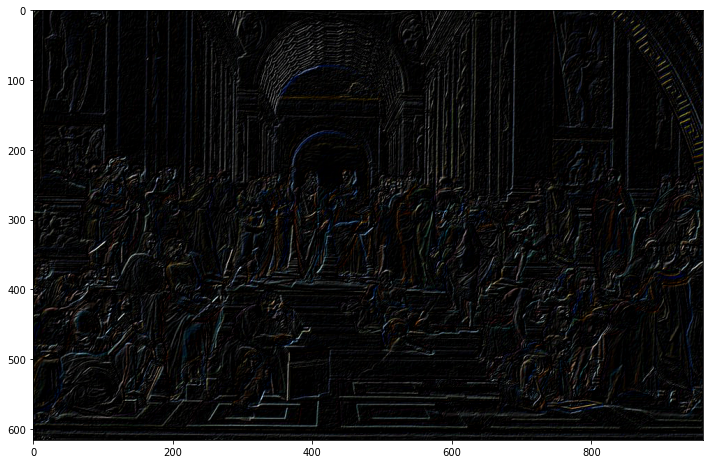

In [ ]:
img = cv2.filter2D(image, -1, kernel)
fig, ax = plt.subplots(1, figsize=(12,8))
plt.imshow(img)

**Finite Laplacian**
As we know, it relies on second order derivatives and it is used to only draw edges of just one pixel, which is an important property of edges.

In [24]:
kernel = np.zeros((3,3))
kernel[0,1] = kernel[1,0] = kernel[2,1] = kernel[1,2] = -1
kernel[1,1] = 4
kernel

array([[ 0., -1.,  0.],
       [-1.,  4., -1.],
       [ 0., -1.,  0.]])

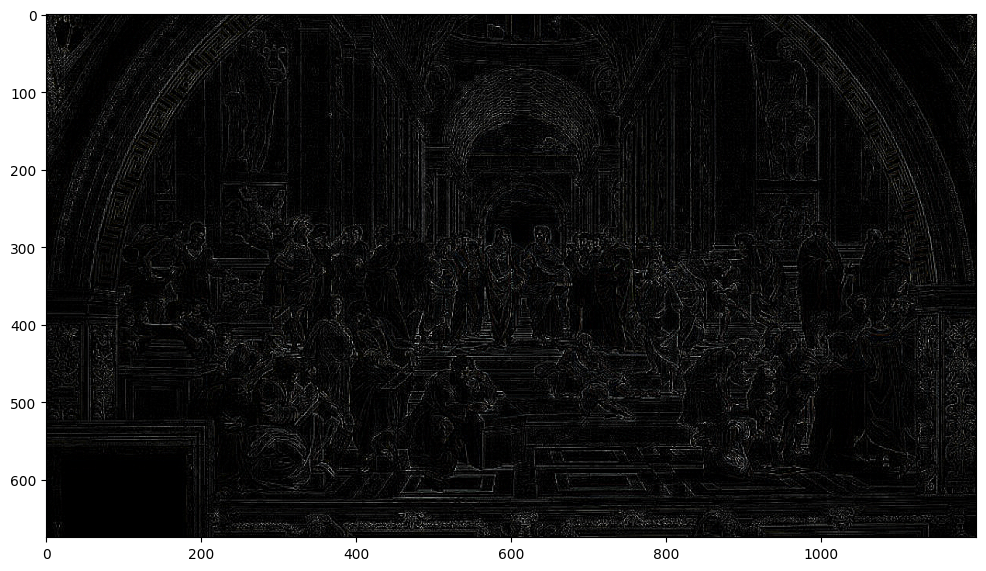

In [25]:
img = cv2.filter2D(image, -1, kernel)
fig, ax = plt.subplots(1, figsize=(12,8))
plt.imshow(img)

Identity

In [26]:
id = np.zeros((3,3))
id[1,1] = 1
id

array([[0., 0., 0.],
       [0., 1., 0.],
       [0., 0., 0.]])

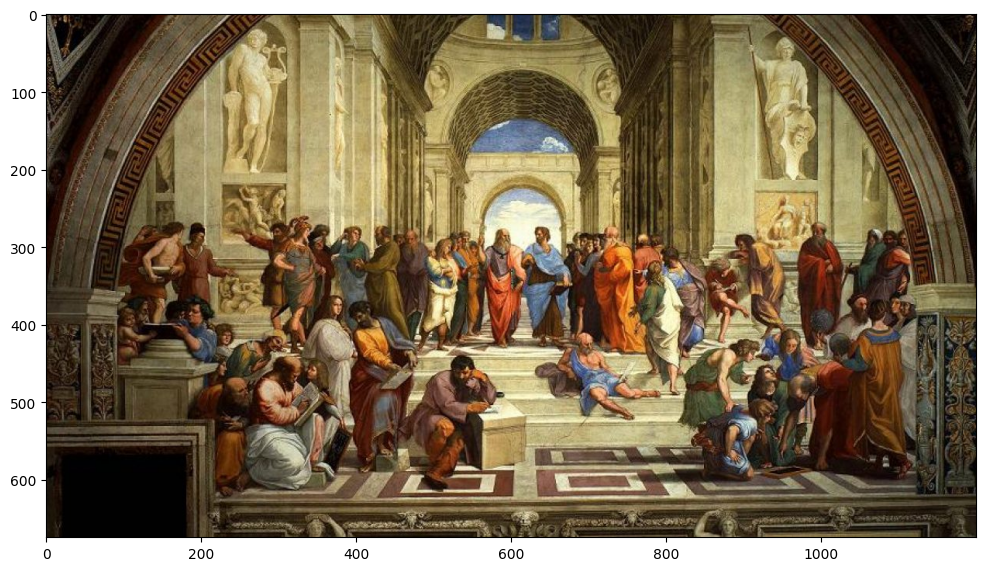

In [28]:
img = cv2.filter2D(image, -1, id)
fig, ax = plt.subplots(1, figsize=(12,8))
plt.imshow(img)

**Reinforcement**
The reinforcement kernel is similar to the finite Laplacian but with a stronger central weight (5 instead of 4).
It amplifies the edge-detection effect by reinforcing the central pixel, making the change in intensity stronger.
It has a sharpening effect because the center pixel is given more weight, while the neighboring pixels have negative weights.

In [29]:
kernel2 = np.zeros((3,3))
kernel2[0,1] = kernel2[1,0] = kernel2[2,1] = kernel2[1,2] = -1
kernel2[1,1] = 5
kernel2

array([[ 0., -1.,  0.],
       [-1.,  5., -1.],
       [ 0., -1.,  0.]])

In [30]:
assert(kernel2 == (kernel + id)).all()

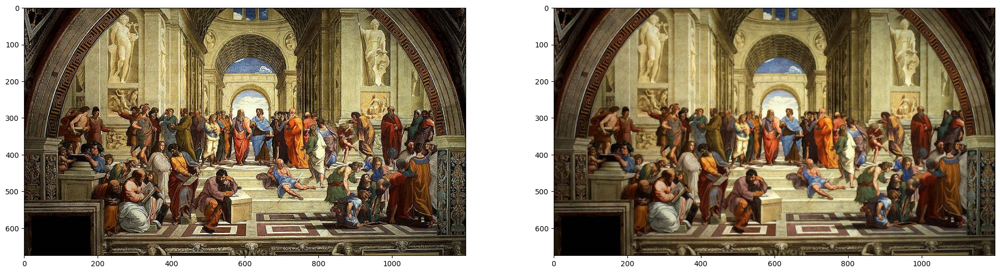

In [31]:
img = cv2.filter2D(image, -1, kernel2)
fig, ax = plt.subplots(1,2, figsize=(24,8))
ax[0].imshow(img);
ax[1].imshow(image);

**Embossing**
The embossing kernel is a filter that creates a 3D effect in the image, making it appear like the image is raised or embossed.
The kernel emphasizes light and dark regions by giving positive and negative weights to the surrounding pixels. This results in a shading effect that looks like light is coming from a particular direction.
The -2 and -1 values create shadows, and the 1 and 2 values create highlights, giving the image a 3D-like appearance.

In [32]:
kernel = np.array([[-2,-1,0],
                   [-1,1,1],
                   [0,1,2]])

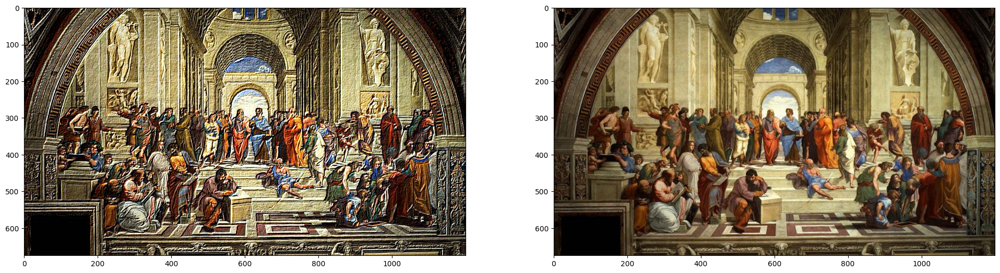

In [33]:
img = cv2.filter2D(image, -1, kernel)
fig, ax = plt.subplots(1,2, figsize=(24,8))
ax[0].imshow(img);
ax[1].imshow(image);